<a href="https://colab.research.google.com/github/MahdiYousefiIRN/Forcasting/blob/main/NetMachinLearningFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


ارایه دهنده مهدی یوسفی
دانشجوی رشته  معماری سیستم های کامپیوتری مقطع کارشناسی ارشد دانشگاه فردوسی مشهد




تعریف مساله:مساله اصلی از نوع پیش بینی مصرف انرژی برق توسط مشترکین برق بر اساس داده های جمع اوری شده یو سی آی  می باشد که ادرس ان در در زیر آورده شده است 
دراین مدل های رایه شده پیش بینی مبتنی بر یادگیری عمیق و الگو ومعماری لایه های مختلف
 را با هم مقایسه میکند و بهتریت الگو را با راندمان بهتر را ازایه  می دهد.

UCI :https://archive.ics.uci.edu/ml/datasets/individual+household+electric+power+consumption

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense,Conv1D,MaxPooling1D
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import Dropout
from keras.layers import Bidirectional,GRU, Embedding,Activation
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import numpy as np
from numpy import nan
from numpy import isnan
import matplotlib.pyplot as plt
import sklearn.preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import math
from google.colab import data_table
from vega_datasets import data
from keras.layers import Concatenate, Dense, Input, LSTM, Embedding, Dropout, Activation, GRU, Flatten


ایجاد اتصال به گوگل درایو

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


*بارگذاری* دیتا ست UCI
در اینجا به جای داده های
 null مقدار nan می گذاریم

In [ ]:
from zmq import NULL
df =pd.read_csv('drive/MyDrive/household_power_consumption.txt', sep=';', header=0, low_memory=False, infer_datetime_format=True, parse_dates={'datetime':[0,1]}, index_col=['datetime'])
df.replace('?',np.nan, inplace=True)
# df.replace('?', NULL, inplace=True)
# df.dtypes
# df['Global_active_power'].fillna(df['Global_active_power'].median(), inplace=True)
df.fillna(df.mean(), inplace=True)
#  df.replace(np.nan, i, inplace=True)
df = df.astype('float32')
data_table.enable_dataframe_formatter()
data_table.DataTable(df, include_index=False, num_rows_per_page=10)



<ipython-input-96-43c8009ce1f6>:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.fillna(df.mean(), inplace=True)


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.839996,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.630005,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.289993,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.740005,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.679993,15.8,0.0,1.0,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.429993,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.000,240.000000,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.000,239.820007,3.8,0.0,0.0,0.0


In [ ]:

print("Befor_DF_IsNull=",df.isnull().sum())
datacopy=df.copy()
print("BeforDrop Datacopy =",datacopy.shape)
# در این روش مقادیر داده ای خالی را حذف میکند 
# datacopy.dropna(inplace=True)
print("AfterDrop Datacopy =",datacopy.shape)
# در این روش میانگی داده های ستون را جایگذاری میکند
datacopy.fillna(datacopy.mean,inplace=True)
print("AfterDrop Datacopy =",datacopy.shape)
# در این روش میانه داده های ستون را جایگذاری میکند
datacopy.fillna(datacopy.median,inplace=True)
print("AfterDrop Datacopy =",datacopy.shape)


Befor_DF_IsNull= Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3               0
dtype: int64
BeforDrop Datacopy = (2075259, 7)
AfterDrop Datacopy = (2075259, 7)
AfterDrop Datacopy = (2075259, 7)
AfterDrop Datacopy = (2075259, 7)


In [ ]:
df.shape
df.info()
df.head(4)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2075259 entries, 2006-12-16 17:24:00 to 2010-11-26 21:02:00
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Global_active_power    float32
 1   Global_reactive_power  float32
 2   Voltage                float32
 3   Global_intensity       float32
 4   Sub_metering_1         float32
 5   Sub_metering_2         float32
 6   Sub_metering_3         float32
dtypes: float32(7)
memory usage: 71.2 MB


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.839996,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.630005,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.289993,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.740005,23.0,0.0,1.0,17.0



از موارد بسیار مهم در بحث تمیز کردن داده های ورودی به شبکه مورد آموزش مبحث مهم  مربوط به داده های گمشده که عمدتا مربوط به یک سری داده ها ی نال یا پرت می باشد این متد داده های  خالی یا نال را  به صورت روزانه شناسایی  میکند

In [ ]:
def fill_missing(values):
  one_day = 60 * 24
  for row in range(values.shape[0]):
    for col in range(values.shape[1]):
      if isnan(values[row, col]):
      	values[row, col] = (values[row - one_day, col])
      

In [ ]:
fill_missing(df.values)
df[df['Global_active_power'].isnull()]
df['Global_active_power']

datetime
2006-12-16 17:24:00    4.216
2006-12-16 17:25:00    5.360
2006-12-16 17:26:00    5.374
2006-12-16 17:27:00    5.388
2006-12-16 17:28:00    3.666
                       ...  
2010-11-26 20:58:00    0.946
2010-11-26 20:59:00    0.944
2010-11-26 21:00:00    0.938
2010-11-26 21:01:00    0.934
2010-11-26 21:02:00    0.932
Name: Global_active_power, Length: 2075259, dtype: float32

نمونه برداری به صورت  دقیقه ای

نمونه برداری از داده ها به صورت ساعتی 

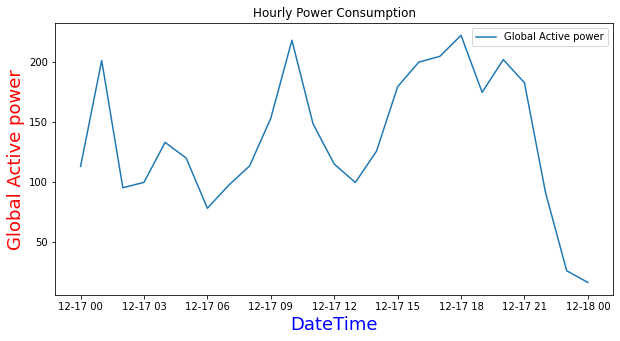

In [ ]:
daily_groups_Hours = df.resample('H')
daily_data_H = daily_groups_Hours.sum()
Daily=daily_data_H.Global_active_power[7:32]
plt.figure(figsize=(10,5))
plt.title("Hourly Power Consumption")
plt.plot(Daily)
plt.xlabel('DateTime',fontsize = 18 ,color='blue')
plt.ylabel('Global Active power',fontsize = 18,color='red' )
plt.legend(['Global Active power', 'Global Active power'], loc='upper right')
plt.show()

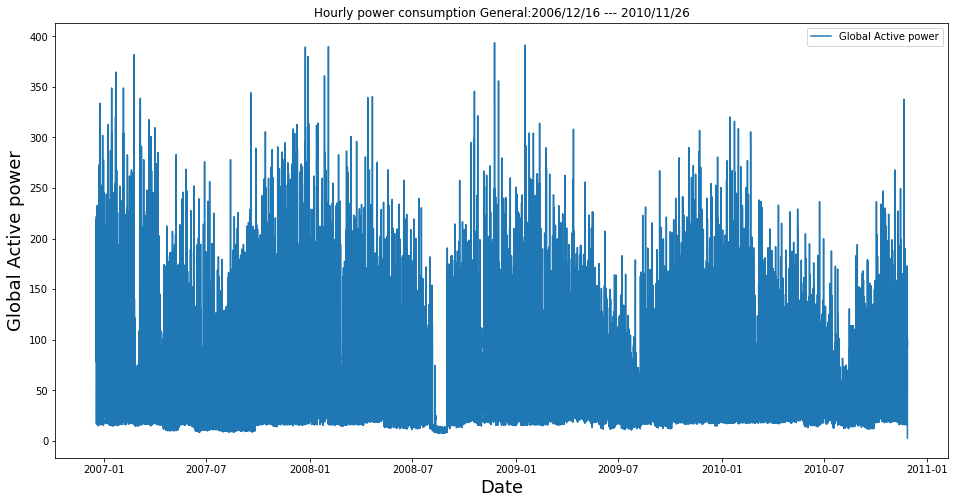

In [ ]:
plt.figure(figsize=(16,8))
plt.title("Hourly power consumption General:2006/12/16 --- 2010/11/26")
plt.plot(daily_data_H['Global_active_power'])
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.legend(['Global Active power', 'Global Active power'], loc='upper right')
plt.show()

In [ ]:
daily_groups = df.resample('D')
daily_data = daily_groups.sum()
daily_data


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16,1209.176025,34.922001,93552.53125,5180.799805,0.0,546.0,4926.0
2006-12-17,3390.459961,226.005997,345725.31250,14398.599609,2033.0,4187.0,13341.0
2006-12-18,2203.825928,161.792007,347373.62500,9247.200195,1063.0,2621.0,14018.0
2006-12-19,1666.193970,150.942001,348479.00000,7094.000000,839.0,7602.0,6197.0
2006-12-20,2225.748047,160.998001,348923.62500,9313.000000,0.0,2648.0,14063.0
...,...,...,...,...,...,...,...
2010-11-22,2041.536011,142.354004,345883.84375,8660.400391,4855.0,2110.0,10136.0
2010-11-23,1577.536011,137.449997,346428.75000,6731.200195,1871.0,458.0,7611.0
2010-11-24,1796.248047,132.460007,345644.59375,7559.399902,1096.0,2848.0,12224.0


نمودار  مصرف برق مشترکین  به صورت روزانه

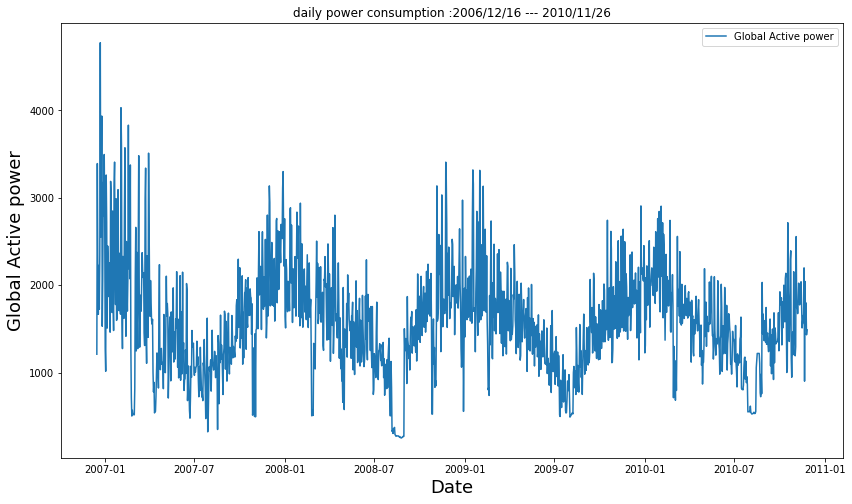

In [ ]:
plt.figure(figsize=(14,8))
plt.title("daily power consumption :2006/12/16 --- 2010/11/26")
plt.plot(daily_data['Global_active_power'])
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.legend(['Global Active power', 'Global Active power'], loc='upper right')
plt.show()

نمایش داده ها به صورت ساعتی 

#  
 جدا کردن داده های تست و روزانه
 را می توان توسط توابع کتابخانه ای مثل skitLearn از هم جدا کرد 

In [ ]:
train_test_split(daily_data,test_size=0.3,train_size=0.7)


[            Global_active_power  Global_reactive_power       Voltage  \
 datetime                                                               
 2010-01-25          1930.510010             147.673996  349774.00000   
 2008-12-10          2214.206055             146.139999  350495.50000   
 2009-09-04          1024.387939             181.063995  348498.53125   
 2009-04-06          1452.634033             131.539993  348913.65625   
 2007-07-26           924.500000             115.092003  338318.96875   
 ...                         ...                    ...           ...   
 2007-08-23          1112.312012             157.953995  346532.12500   
 2009-11-07          1557.176025             197.679993  348305.15625   
 2007-11-19          1723.654053             112.029999  349583.56250   
 2008-11-29          2434.667969             166.509995  347386.68750   
 2007-03-27          1105.140015             151.725998  346466.84375   
 
             Global_intensity  Sub_metering_1  Su

In [ ]:
train_size = int(len(daily_data) * 0.80)
test_size = len(daily_data) - train_size
train, test = daily_data.iloc[0:train_size], daily_data.iloc[train_size:len(daily_data)]
print("train : ",len(train)," -------  test : " ,len(test))

print("*******************************")
print( train)
print("*******************************")
print( test)
print("*******************************")








train :  1153  -------  test :  289
*******************************
            Global_active_power  Global_reactive_power       Voltage  \
datetime                                                               
2006-12-16          1209.176025              34.922001   93552.53125   
2006-12-17          3390.459961             226.005997  345725.31250   
2006-12-18          2203.825928             161.792007  347373.62500   
2006-12-19          1666.193970             150.942001  348479.00000   
2006-12-20          2225.748047             160.998001  348923.62500   
...                         ...                    ...           ...   
2010-02-06          2712.986084             296.614014  347172.59375   
2010-02-07          1625.708008             162.466003  349465.62500   
2010-02-08          2582.238037             139.750000  348475.37500   
2010-02-09          2420.931885             139.712006  350136.53125   
2010-02-10          1946.878052             141.621994  349124.37500

train , test

*نرمال* سازی داده ها بین مقادیر صفر تا یک  با تابع مین مکس اسکیلر وبا استفاده  از کتابخانه 
سایکیت لرن

In [ ]:
from sklearn.preprocessing import MinMaxScaler
f_columns = ['Global_reactive_power',	'Voltage',	'Global_intensity',	'Sub_metering_1',	'Sub_metering_2',	'Sub_metering_3']
f_transformer = MinMaxScaler()
f_transformer = f_transformer.fit(train[f_columns].to_numpy())
print(f_transformer)

MinMaxScaler()


In [ ]:
train.loc[:, f_columns] = f_transformer.transform(train[f_columns].to_numpy())
test.loc[:, f_columns]   = f_transformer.transform(test[f_columns].to_numpy())

/usr/local/lib/python3.9/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.9/dist-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
/usr/local/lib/python3.9/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

In [ ]:
cnt_transformer = MinMaxScaler()
cnt_transformer = cnt_transformer.fit(train[['Global_active_power']])
train['Global_active_power'] = cnt_transformer.transform(train[['Global_active_power']])
test['Global_active_power'] = cnt_transformer.transform(test[['Global_active_power']])
print("****************************************")
print("trainMax=",train['Global_active_power'].max)
print("trainMin=",train['Global_active_power'].min)
print("****************************************")
train['Global_active_power'].max
train['Global_active_power'].min

****************************************
trainMax= <bound method NDFrame._add_numeric_operations.<locals>.max of datetime
2006-12-16    0.211996
2006-12-17    0.694252
2006-12-18    0.431901
2006-12-19    0.313037
2006-12-20    0.436748
                ...   
2010-02-06    0.544470
2010-02-07    0.304086
2010-02-08    0.515564
2010-02-09    0.479901
2010-02-10    0.375093
Freq: D, Name: Global_active_power, Length: 1153, dtype: float32>
trainMin= <bound method NDFrame._add_numeric_operations.<locals>.min of datetime
2006-12-16    0.211996
2006-12-17    0.694252
2006-12-18    0.431901
2006-12-19    0.313037
2006-12-20    0.436748
                ...   
2010-02-06    0.544470
2010-02-07    0.304086
2010-02-08    0.515564
2010-02-09    0.479901
2010-02-10    0.375093
Freq: D, Name: Global_active_power, Length: 1153, dtype: float32>
****************************************


<ipython-input-111-4c93b573a276>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Global_active_power'] = cnt_transformer.transform(train[['Global_active_power']])
<ipython-input-111-4c93b573a276>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Global_active_power'] = cnt_transformer.transform(test[['Global_active_power']])


<bound method NDFrame._add_numeric_operations.<locals>.min of datetime
2006-12-16    0.211996
2006-12-17    0.694252
2006-12-18    0.431901
2006-12-19    0.313037
2006-12-20    0.436748
                ...   
2010-02-06    0.544470
2010-02-07    0.304086
2010-02-08    0.515564
2010-02-09    0.479901
2010-02-10    0.375093
Freq: D, Name: Global_active_power, Length: 1153, dtype: float32>

create Dataset

In [ ]:
def create_dataset(X, y, time_steps):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps),1:].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps:i + time_steps+1])
    return np.array(Xs), np.array(ys)

In [ ]:

def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    print(df['date'])
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]

  



description

در اینجا داده های مقادیر روزانه را به دوقسمت داده های تست و اموزش به صورت سه روزی به متد ساخت ارایه از روی دیتا ست میدهیم تا ابعاد ارایه را مشخص کند

In [ ]:
time_steps = 3
# reshape to [samples, time_steps, n_features]
X_train, y_train = create_dataset(train, train.Global_active_power, time_steps)
X_test, y_test = create_dataset(test, test.Global_active_power, time_steps)
print("**********************************************************")
print("X_train = ",X_train.shape," --------- y_train = ", y_train.shape)

print("**********************************************************")
print("X_test =",X_test.shape," ---------  y_test = ", y_test.shape)
print("**********************************************************")
print(X_train)


**********************************************************
X_train =  (1150, 3, 6)  --------- y_train =  (1150, 1)
**********************************************************
X_test = (286, 3, 6)  ---------  y_test =  (286, 1)
**********************************************************
[[[0.         0.         0.21100625 0.         0.04509043 0.1620129 ]
  [0.49902847 0.9597301  0.69522595 0.18187511 0.34577587 0.5367624 ]
  [0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]]

 [[0.49902847 0.9597301  0.69522595 0.18187511 0.34577587 0.5367624 ]
  [0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]
  [0.3029939  0.97021013 0.31150848 0.07505815 0.6277975  0.218615  ]]

 [[0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]
  [0.3029939  0.97021013 0.31150848 0.07505815 0.6277975  0.218615  ]
  [0.3292558  0.9719023  0.42807463 0.         0.21868032 0.5689156 ]]

 ...

 [[0.28219536 0.96989197 0.39842615 0.08069422 0.03914444 0.7446003 ]
  [

مدل ارایه شده

مقادیری که حاوی داده های لایه  Embedding

In [ ]:
# Embedding
max_features = 20000
maxlen = 100
embedding_size = 128

# Convolution
kernel_size = 2
filters = 128
pool_size = 2

# LSTM
lstm_output_size = 128

# Training
batch_size = 128
epochs = 100

مدل اول مورد بررسی  ترکیب لایه های 
CNN
Bidirectional -LSTM 



In [ ]:
model_CNN_BI_LSTM = Sequential()
model_CNN_BI_LSTM.add(Conv1D(filters,kernel_size, padding='valid',activation='relu',
                 strides=1))
model_CNN_BI_LSTM.add(MaxPooling1D(pool_size=pool_size))
model_CNN_BI_LSTM.add(Bidirectional(LSTM(lstm_output_size, activation='relu',return_sequences=True)))
model_CNN_BI_LSTM.add(Bidirectional(LSTM(lstm_output_size, activation='relu',return_sequences=True)))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=False))
model_CNN_BI_LSTM.add(RepeatVector(7))
model_CNN_BI_LSTM.add(LSTM(128, activation='relu', return_sequences=True))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=True))
model_CNN_BI_LSTM.add(Dropout(0.25))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=False))
model_CNN_BI_LSTM.add(Dropout(0.25))
model_CNN_BI_LSTM.add(Flatten())
model_CNN_BI_LSTM.add(Dense(128,activation='relu'))
model_CNN_BI_LSTM.add(Dense( units=1))
opt = keras.optimizers.Adam()
# model_BI_LSTM.compile(loss='mse', optimizer='adam')
model_CNN_BI_LSTM.compile(loss='mse',optimizer=opt, metrics=['accuracy'])
model_CNN_BI_LSTM.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data
print(model_CNN_BI_LSTM.summary())



Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_22 (Conv1D)          (None, 2, 128)            1664      
                                                                 
 max_pooling1d_21 (MaxPoolin  (None, 1, 128)           0         
 g1D)                                                            
                                                                 
 bidirectional_52 (Bidirecti  (None, 1, 256)           263168    
 onal)                                                           
                                                                 
 bidirectional_53 (Bidirecti  (None, 1, 256)           394240    
 onal)                                                           
                                                                 
 lstm_144 (LSTM)             (None, 128)               197120    
                                                     

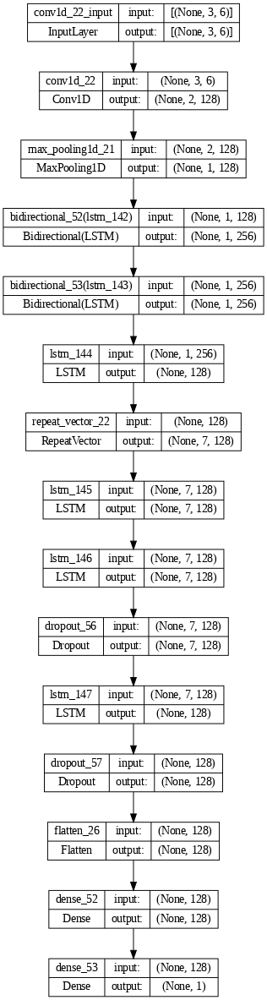

In [ ]:
keras.utils.plot_model(model_CNN_BI_LSTM, show_shapes=True, dpi = 70)

In [ ]:
print('ُStart Training ...')
history = model_CNN_BI_LSTM.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)
# history = model_CNN_BI_LSTM.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)


ُStart Training ...
Epoch 1/100
7/7 [==============================] - 16s 698ms/step - loss: 0.0911 - accuracy: 0.0012 - val_loss: 0.0334 - val_accuracy: 0.0000e+00
Epoch 2/100
7/7 [==============================] - 1s 131ms/step - loss: 0.0328 - accuracy: 0.0012 - val_loss: 0.0246 - val_accuracy: 0.0000e+00
Epoch 3/100
7/7 [==============================] - 1s 139ms/step - loss: 0.0258 - accuracy: 0.0012 - val_loss: 0.0127 - val_accuracy: 0.0000e+00
Epoch 4/100
7/7 [==============================] - 1s 126ms/step - loss: 0.0235 - accuracy: 0.0012 - val_loss: 0.0126 - val_accuracy: 0.0000e+00
Epoch 5/100
7/7 [==============================] - 1s 129ms/step - loss: 0.0223 - accuracy: 0.0012 - val_loss: 0.0128 - val_accuracy: 0.0000e+00
Epoch 6/100
7/7 [==============================] - 1s 130ms/step - loss: 0.0221 - accuracy: 0.0012 - val_loss: 0.0128 - val_accuracy: 0.0000e+00
Epoch 7/100
7/7 [==============================] - 1s 134ms/step - loss: 0.0224 - accuracy: 0.0012 - val_loss

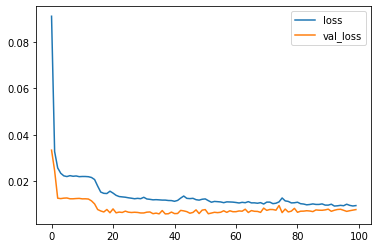

In [ ]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

In [ ]:
y_pred = model_CNN_BI_LSTM.predict(X_test)
print('y_train=',y_train)
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))

print(y_test_inv.shape)
print(y_pred_inv.shape)

testScore = math.sqrt(mean_squared_error(y_test, y_pred))
MAPE=mean_absolute_percentage_error(y_test, y_pred)
MAE =mean_absolute_error(y_test, y_pred)
print('******  model_CNN_BI_LSTM  ********')
print('Test Score: %.2f RMSE' % (testScore))
print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))

9/9 [==============================] - 1s 19ms/step
y_train= [[0.31303743]
 [0.43674806]
 [0.32566023]
 ...
 [0.51556367]
 [0.47990084]
 [0.37509328]]
(1, 286)
(1, 286)
******  model_CNN_BI_LSTM  ********
Test Score: 0.09 RMSE
Test Score: 0.28 MAPE
Test Score: 0.06 MAE


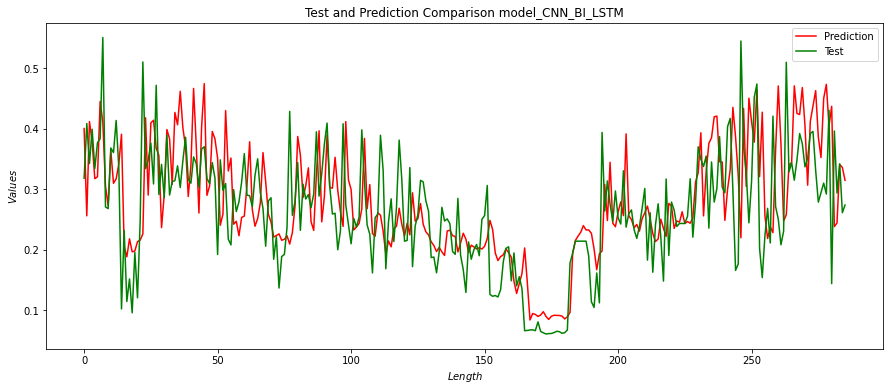

In [ ]:
ax=plt.figure(figsize=(15,6))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison model_CNN_BI_LSTM")
plt.plot(y_pred , label='pred',color='red')
plt.plot(y_test , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

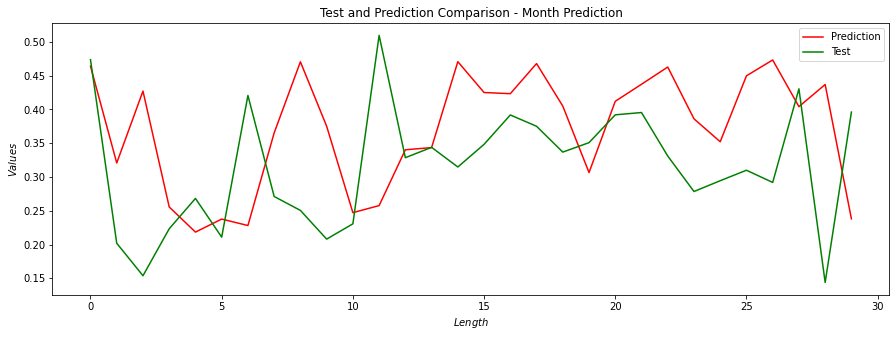

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison - Month Prediction")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

Model BI_GRU

In [ ]:
model_BI_GRU = Sequential()
model_BI_GRU.add(Bidirectional(GRU(128, activation='relu',return_sequences=True)))
model_BI_GRU.add(Bidirectional(GRU(128, activation='relu',return_sequences=True)))
model_BI_GRU.add(GRU(128, activation='relu', return_sequences=True))
model_BI_GRU.add(Dropout(0.25))
model_BI_GRU.add(GRU(128, activation='relu', return_sequences=True))
model_BI_GRU.add(Dropout(0.25))
model_BI_GRU.add(GRU(128, activation='relu', return_sequences=False))
model_BI_GRU.add(Dropout(0.25))
model_BI_GRU.add(Flatten())
model_BI_GRU.add(Dense(128,activation='relu'))
model_BI_GRU.add(Dense( units=1))
# opt = keras.optimizers.Adam(learning_rate=0.001)
model_BI_GRU.compile(loss='mse', optimizer='adam')
model_BI_GRU.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data                         # e.g. input_shape = (None, 32, 32, 3)
model_BI_GRU.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_54 (Bidirecti  (None, 3, 256)           104448    
 onal)                                                           
                                                                 
 bidirectional_55 (Bidirecti  (None, 3, 256)           296448    
 onal)                                                           
                                                                 
 gru_12 (GRU)                (None, 3, 128)            148224    
                                                                 
 dropout_58 (Dropout)        (None, 3, 128)            0         
                                                                 
 gru_13 (GRU)                (None, 3, 128)            99072     
                                                                 
 dropout_59 (Dropout)        (None, 3, 128)          

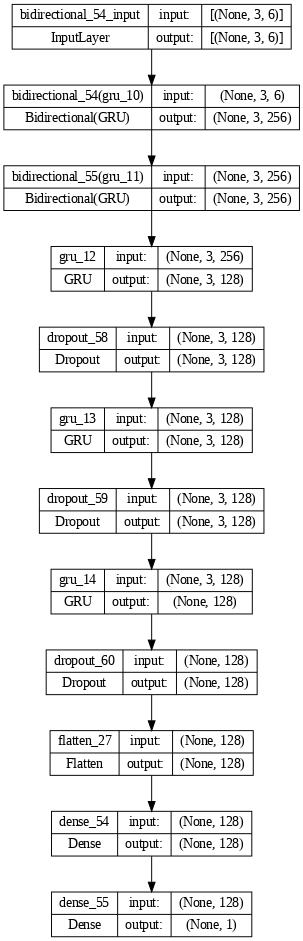

In [ ]:
keras.utils.plot_model(model_BI_GRU, show_shapes=True, dpi = 70)

In [ ]:
history = model_BI_GRU.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)

Epoch 1/100
7/7 [==============================] - 13s 251ms/step - loss: 0.0852 - val_loss: 0.0132
Epoch 2/100
7/7 [==============================] - 1s 82ms/step - loss: 0.0269 - val_loss: 0.0114
Epoch 3/100
7/7 [==============================] - 1s 88ms/step - loss: 0.0228 - val_loss: 0.0121
Epoch 4/100
7/7 [==============================] - 1s 85ms/step - loss: 0.0209 - val_loss: 0.0139
Epoch 5/100
7/7 [==============================] - 1s 88ms/step - loss: 0.0212 - val_loss: 0.0104
Epoch 6/100
7/7 [==============================] - 1s 86ms/step - loss: 0.0197 - val_loss: 0.0098
Epoch 7/100
7/7 [==============================] - 1s 86ms/step - loss: 0.0179 - val_loss: 0.0084
Epoch 8/100
7/7 [==============================] - 1s 86ms/step - loss: 0.0165 - val_loss: 0.0070
Epoch 9/100
7/7 [==============================] - 1s 83ms/step - loss: 0.0160 - val_loss: 0.0064
Epoch 10/100
7/7 [==============================] - 1s 86ms/step - loss: 0.0154 - val_loss: 0.0072
Epoch 11/100
7/7 

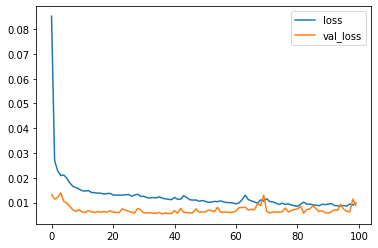

In [ ]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

In [ ]:
y_pred = model_BI_GRU.predict(X_test)
print('y_train=',y_train)
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))
print(y_test_inv.shape)
print(y_pred_inv.shape)
testScore = math.sqrt(mean_squared_error(y_test, y_pred))
MAPE=mean_absolute_percentage_error(y_test, y_pred)
MAE =mean_absolute_error(y_test, y_pred)
print('*****  model_BI_GRU  *************' )
print('Test Score: %.2f RMSE' % (testScore))
print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))

9/9 [==============================] - 2s 18ms/step
y_train= [[0.31303743]
 [0.43674806]
 [0.32566023]
 ...
 [0.51556367]
 [0.47990084]
 [0.37509328]]
(1, 286)
(1, 286)
*****  model_BI_GRU  *************
Test Score: 0.10 RMSE
Test Score: 0.37 MAPE
Test Score: 0.08 MAE


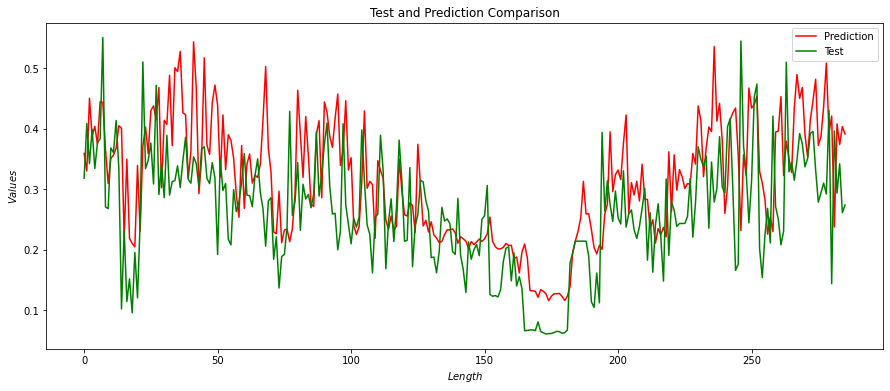

In [ ]:
ax=plt.figure(figsize=(15,6))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(y_pred , label='pred',color='red')
plt.plot(y_test , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

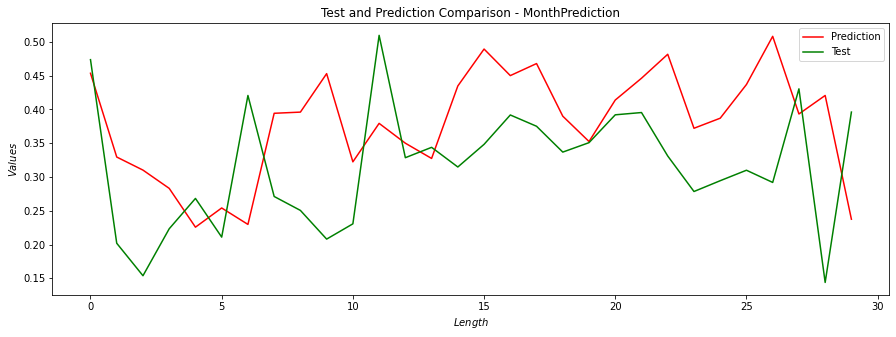

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison - MonthPrediction")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

model BI_LSTM 

In [ ]:
model_BI_LSTM = Sequential()
model_BI_LSTM.add(Bidirectional(LSTM(128, activation='relu',return_sequences=True)))
model_BI_LSTM.add(Bidirectional(LSTM(128, activation='relu',return_sequences=True)))
model_BI_LSTM.add(LSTM(128, activation='relu', return_sequences=True))
model_BI_LSTM.add(Dropout(0.25))
model_BI_LSTM.add(LSTM(128, activation='relu', return_sequences=True))
model_BI_LSTM.add(Dropout(0.25))
model_BI_LSTM.add(LSTM(128, activation='relu', return_sequences=False))
model_BI_LSTM.add(Dropout(0.25))
model_BI_LSTM.add(Flatten())
model_BI_LSTM.add(Dense(128,activation='relu'))
model_BI_LSTM.add(Dense( units=1))
# opt = keras.optimizers.Adam(learning_rate=0.001)
model_BI_LSTM.compile(loss='mse', optimizer='adam')
model_BI_LSTM.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data                         # e.g. input_shape = (None, 32, 32, 3)
model_BI_LSTM.summary()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_56 (Bidirecti  (None, 3, 256)           138240    
 onal)                                                           
                                                                 
 bidirectional_57 (Bidirecti  (None, 3, 256)           394240    
 onal)                                                           
                                                                 
 lstm_150 (LSTM)             (None, 3, 128)            197120    
                                                                 
 dropout_61 (Dropout)        (None, 3, 128)            0         
                                                                 
 lstm_151 (LSTM)             (None, 3, 128)            131584    
                                                                 
 dropout_62 (Dropout)        (None, 3, 128)          

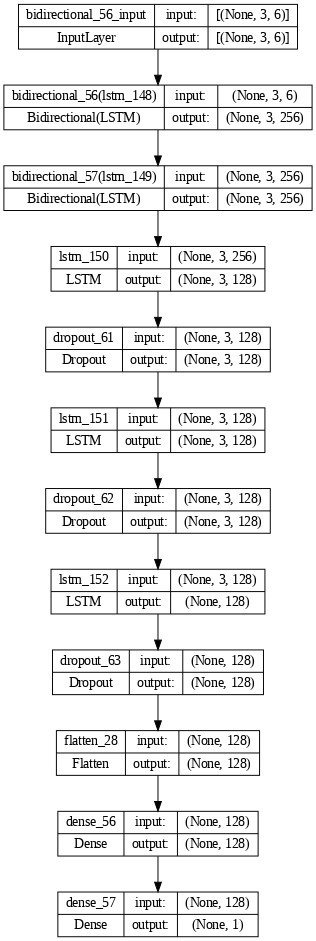

In [ ]:
keras.utils.plot_model(model_BI_LSTM, show_shapes=True, dpi = 70)

In [ ]:
history = model_BI_LSTM.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)

Epoch 1/100
7/7 [==============================] - 14s 271ms/step - loss: 0.0972 - val_loss: 0.0521
Epoch 2/100
7/7 [==============================] - 1s 94ms/step - loss: 0.0481 - val_loss: 0.0120
Epoch 3/100
7/7 [==============================] - 1s 96ms/step - loss: 0.0271 - val_loss: 0.0150
Epoch 4/100
7/7 [==============================] - 1s 93ms/step - loss: 0.0220 - val_loss: 0.0123
Epoch 5/100
7/7 [==============================] - 1s 96ms/step - loss: 0.0226 - val_loss: 0.0122
Epoch 6/100
7/7 [==============================] - 1s 107ms/step - loss: 0.0219 - val_loss: 0.0125
Epoch 7/100
7/7 [==============================] - 1s 98ms/step - loss: 0.0217 - val_loss: 0.0128
Epoch 8/100
7/7 [==============================] - 1s 99ms/step - loss: 0.0217 - val_loss: 0.0120
Epoch 9/100
7/7 [==============================] - 1s 97ms/step - loss: 0.0212 - val_loss: 0.0118
Epoch 10/100
7/7 [==============================] - 1s 96ms/step - loss: 0.0206 - val_loss: 0.0111
Epoch 11/100
7/7

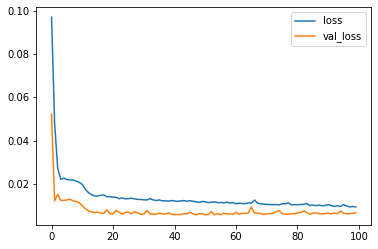

In [ ]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

In [ ]:
y_pred = model_BI_LSTM.predict(X_test)
print('y_train=',y_train)
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))
print(y_test_inv.shape)
print(y_pred_inv.shape)
testScore = math.sqrt(mean_squared_error(y_test, y_pred))
MAPE=mean_absolute_percentage_error(y_test, y_pred)
MAE =mean_absolute_error(y_test, y_pred)
print('******* model_BI_LSTM ********************')
print('Test Score: %.2f RMSE' % (testScore))
print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))

9/9 [==============================] - 0s 24ms/step
y_train= [[0.31303743]
 [0.43674806]
 [0.32566023]
 ...
 [0.51556367]
 [0.47990084]
 [0.37509328]]
(1, 286)
(1, 286)
******* model_BI_LSTM ********************
Test Score: 0.08 RMSE
Test Score: 0.23 MAPE
Test Score: 0.06 MAE


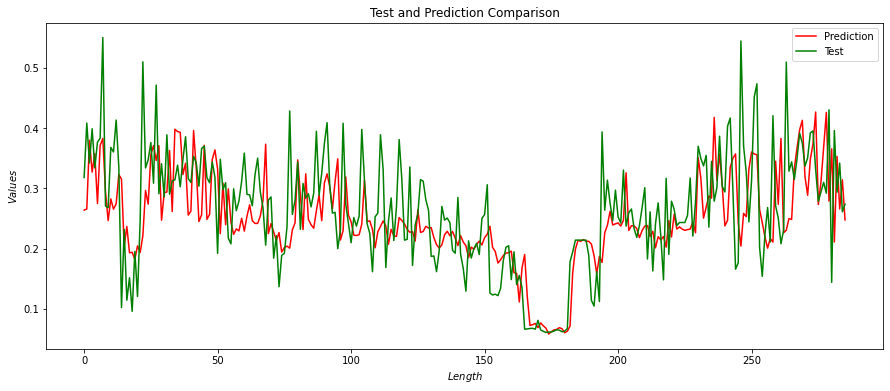

In [ ]:
ax=plt.figure(figsize=(15,6))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(y_pred , label='pred',color='red')
plt.plot(y_test , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

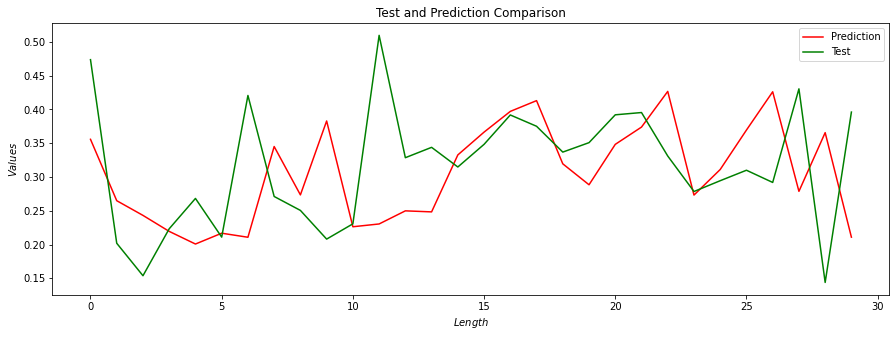

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

Model BI_LSTM_Attenion

In [ ]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [],[]
    for i in range(len(X) - time_steps):
        v = X.iloc[(i + time_steps),1:].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps:i + time_steps+1])
    return np.array(Xs), np.array(ys)

In [ ]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    print(df['date'])
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]

In [ ]:
time_steps = 3
# reshape to [samples, time_steps, n_features]
X_train, y_train = create_dataset(train, train.Global_active_power, time_steps)
X_test, y_test = create_dataset(test, test.Global_active_power, time_steps)
print("**********************************************************")
print("X_train = ",X_train.shape," --------- y_train = ", y_train.shape)

print("**********************************************************")
print("X_test =",X_test.shape," ---------  y_test = ", y_test.shape)
print("**********************************************************")
print(X_train)

**********************************************************
X_train =  (1150, 6)  --------- y_train =  (1150, 1)
**********************************************************
X_test = (286, 6)  ---------  y_test =  (286, 1)
**********************************************************
[[0.3029939  0.97021013 0.31150848 0.07505815 0.6277975  0.218615  ]
 [0.3292558  0.9719023  0.42807463 0.         0.21868032 0.5689156 ]
 [0.28599784 0.96494824 0.3205648  0.15789944 0.22231399 0.4072998 ]
 ...
 [0.27376524 0.9701963  0.499191   0.10386474 0.03559336 0.8228011 ]
 [0.273666   0.97651845 0.4623248  0.10860619 0.03385912 0.8230238 ]
 [0.27865407 0.9726663  0.36334598 0.1090535  0.24576761 0.48686075]]


In [ ]:
class Attention(tf.keras.Model):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) # input x weights
        self.W2 = tf.keras.layers.Dense(units) # hidden states h weights
        self.V = tf.keras.layers.Dense(1) # V

    def call(self, features, hidden):
        # hidden shape == (batch_size, hidden size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden size)
        # we are doing this to perform addition to calculate the score
        hidden_with_time_axis = tf.expand_dims(hidden, 1)
          
        # score shape == (batch_size, max_length, 1)
        # we get 1 at the last axis because we are applying score to self.V
        # the shape of the tensor before applying self.V is (batch_size, max_length, units)
        score = tf.nn.tanh(
            self.W1(features) + self.W2(hidden_with_time_axis)) ## w[x, h]
        # attention_weights shape == (batch_size, max_length, 1)
        attention_weights = tf.nn.softmax(self.V(score), axis=1) ## v tanh(w[x,h])
          
        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features ## attention_weights * x, right now the context_vector shape [batzh_size, max_length, hidden_size]
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector, attention_weights

In [ ]:
# Convolution
kernel_size = 2
filters = 64
pool_size = 4

# LSTM
lstm_output_size = 6

# Training
batch_size = 128
epochs = 100
# Embedding
max_features = 20000
maxlen = 100
embedding_size = 128
# Convolution
kernel_size = 2
filters = 64
pool_size = 2
# LSTM
lstm_output_size = 128
# Training
max_features = 20000
maxlen = 100
embedding_size = 128
batch_size = 128
epochs = 100
MAX_FEATURES = 60000
EMBED_SIZE = 128
RNN_CELL_SIZE = 128
MAX_LEN = 6  # Since our mean length is 128.5
sequence_input = Input(shape=(MAX_LEN,), dtype="float32")
embedded_sequences = Embedding(MAX_FEATURES, EMBED_SIZE)(sequence_input)

In [ ]:
model = Sequential()
# model_CNN_BI_LSTM.add(Conv1D(filters,kernel_size, padding='valid',activation='relu',
#                  strides=1))
# model_CNN_BI_LSTM.add(MaxPooling1D(pool_size=pool_size))
# # state_h=Bidirectional(LSTM(lstm_output_size, activation='relu',return_sequences=True))
# # state_c=Bidirectional(LSTM(lstm_output_size, activation='relu',return_sequences=True))
# lstm=model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu',return_sequences=True))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(LSTM(128, activation='relu', return_sequences=False))
model.add(RepeatVector(7))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(Bidirectional(LSTM(128, activation='relu',return_sequences=True)))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(Dropout(0.25))
model.add(LSTM(128, activation='relu', return_sequences=False))
model.add(Dropout(0.25))
model.add(Flatten())
# model.add(Dense(12,activation='relu'))
# model.add(Dense( units=1))
state_c=LSTM(lstm_output_size, activation='relu',return_sequences=True)
# state_c = Concatenate()([forward_c, backward_c])
lstm = Bidirectional(LSTM(RNN_CELL_SIZE, return_sequences = True), name="bi_lstm_0")(embedded_sequences)
# Getting our LSTM outputs
(lstm, forward_h, forward_c, backward_h, backward_c) = Bidirectional(LSTM(RNN_CELL_SIZE, return_sequences=True, return_state=True), name="bi_lstm_1")(lstm)
state_h = Concatenate()([forward_h, backward_h])
context_vector, attention_weights = Attention(10)(lstm, state_h) # `lstm` the input features; `state_h` the hidden states from LSTM
dense1 = Dense(128, activation="relu")(context_vector)
dropout = Dropout(0.05)(dense1)
# lstm=model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu',return_sequences=True))
output = Dense(1, activation="relu")(dropout)  
model = keras.Model(inputs=sequence_input, outputs=output)
# summarize layers
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 6)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 6, 128)       7680000     ['input_1[0][0]']                
                                                                                                  
 bi_lstm_0 (Bidirectional)      (None, 6, 256)       263168      ['embedding[0][0]']              
                                                                                                  
 bi_lstm_1 (Bidirectional)      [(None, 6, 256),     394240      ['bi_lstm_0[0][0]']              
                                 (None, 128),                                                 

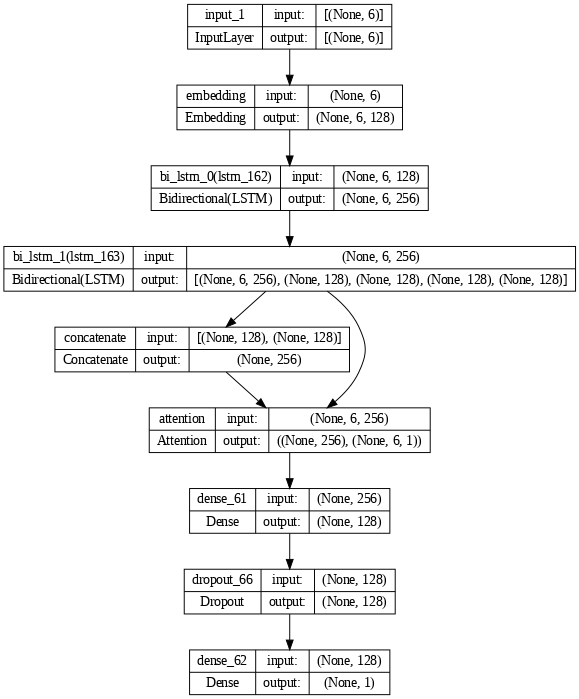

In [ ]:
keras.utils.plot_model(model, show_shapes=True, dpi = 70)

In [ ]:
model.compile(loss='mse', optimizer='adam',metrics='accuracy')


In [ ]:
BATCH_SIZE = 100
EPOCHS =100
history = model.fit(X_train,y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_split=0.3)

Epoch 1/100
9/9 [==============================] - 13s 355ms/step - loss: 0.0219 - accuracy: 0.0012 - val_loss: 0.0134 - val_accuracy: 0.0000e+00
Epoch 2/100
9/9 [==============================] - 1s 156ms/step - loss: 0.0222 - accuracy: 0.0012 - val_loss: 0.0158 - val_accuracy: 0.0000e+00
Epoch 3/100
9/9 [==============================] - 1s 165ms/step - loss: 0.0215 - accuracy: 0.0012 - val_loss: 0.0129 - val_accuracy: 0.0000e+00
Epoch 4/100
9/9 [==============================] - 2s 279ms/step - loss: 0.0223 - accuracy: 0.0012 - val_loss: 0.0137 - val_accuracy: 0.0000e+00
Epoch 5/100
9/9 [==============================] - 2s 223ms/step - loss: 0.0219 - accuracy: 0.0012 - val_loss: 0.0135 - val_accuracy: 0.0000e+00
Epoch 6/100
9/9 [==============================] - 1s 164ms/step - loss: 0.0218 - accuracy: 0.0012 - val_loss: 0.0144 - val_accuracy: 0.0000e+00
Epoch 7/100
9/9 [==============================] - 1s 164ms/step - loss: 0.0224 - accuracy: 0.0012 - val_loss: 0.0126 - val_accur

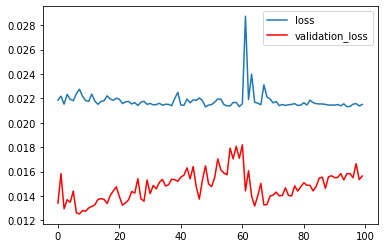

In [ ]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation',color='red')
plt.legend(['loss', 'validation_loss'], loc='upper right')
plt.show()

In [ ]:
y_pred = model.predict(X_test)
print('y_train=',y_train)
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))
print(y_test_inv.shape)
print(y_pred_inv.shape)
testScore = math.sqrt(mean_squared_error(y_test, y_pred))
MAPE=mean_absolute_percentage_error(y_test, y_pred)
MAE =mean_absolute_error(y_test, y_pred)
print('********  BI_LSTM_Attention ************' )
print('Test Score: %.2f RMSE' % (testScore))
print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))

9/9 [==============================] - 0s 28ms/step
y_train= [[0.31303743]
 [0.43674806]
 [0.32566023]
 ...
 [0.51556367]
 [0.47990084]
 [0.37509328]]
(1, 286)
(1, 286)
********  BI_LSTM_Attention ************
Test Score: 0.10 RMSE
Test Score: 0.54 MAPE
Test Score: 0.08 MAE


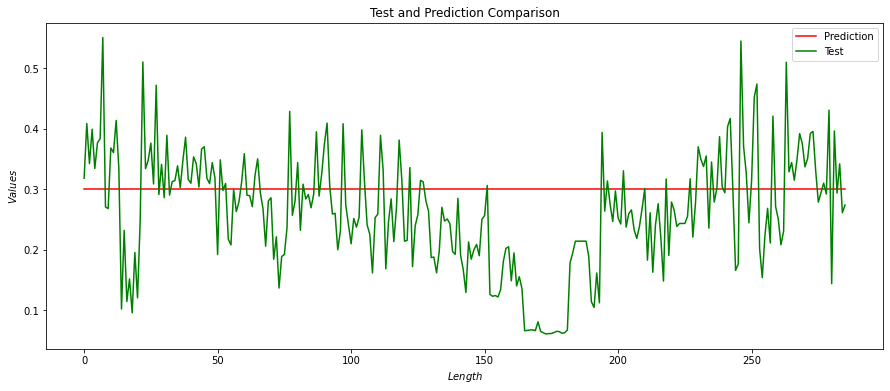

In [ ]:
ax=plt.figure(figsize=(15,6))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(y_pred , label='pred',color='red')
plt.plot(y_test , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

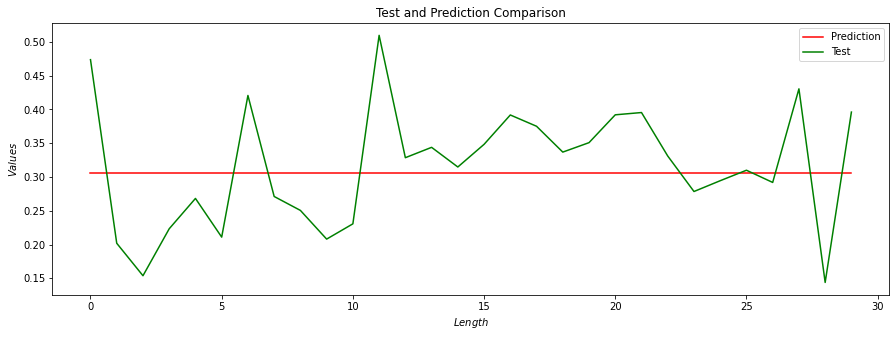

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()